<a href="https://colab.research.google.com/github/dashanovoj/Practice_1_/blob/master/KursovayaDN_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Шаг 1.** Установка необходимых библиотек


In [ ]:
!pip install ultralytics
!pip install roboflow
!pip install opencv-python
!pip install pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

# **Шаг 2.** Загрузка датасета

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="NWyXCEfTHbTFSggh2r95")
project = rf.workspace("neural-networks-ezxre").project("chocolate-defects-detection-and-classification")
version = project.version(4)
dataset = version.download("yolov8")


# Ссылка на датасет: https://app.roboflow.com/neural-networks-ezxre/chocolate-defects-detection-and-classification

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Chocolate-Defects-Detection-And-Classification-4 in yolov8:: 100%|██████████| 2328/2328 [00:00<00:00, 7377.90it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# **Шаг 3.** Обучение модели

In [ ]:
from ultralytics import YOLO
import os

# Определение пути к файлу data.yaml - в файле меняем ссылки на train/valid/test
data_yaml_path = os.path.join(dataset.location, 'data.yaml')

# Инициализация модели YOLOv8n - использование нано-модели для скорости
model = YOLO('yolov8n.pt')  # Загрузка предобученной модели

# Обучение модели
model.train(task='detect', mode='train', data=data_yaml_path, epochs=10)

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Chocolate-Defects-Detection-And-Classification-4/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.

train: Scanning /content/Chocolate-Defects-Detection-And-Classification-4/train/labels.cache... 809 images, 3 backgrounds, 0 corrupt: 100%|██████████| 809/809 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 824, len(boxes) = 839. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 436.3±287.0 MB/s, size: 24.6 KB)



val: Scanning /content/Chocolate-Defects-Detection-And-Classification-4/valid/labels.cache... 231 images, 2 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]

val: /content/Chocolate-Defects-Detection-And-Classification-4/valid/images/photo_2025-04-15_18-00-00_jpg.rf.83eb890ba1c2732b513739f6b89fbdfc.jpg: 1 duplicate labels removed
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 233, len(boxes) = 235. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/train3/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]


KeyboardInterrupt: 

# **Шаг 4.** Валидация модели

In [ ]:
metrics = model.val()

# Вывод метрик для оценки модели
print("Метрики оценки качества модели:", metrics)

Ultralytics 8.3.137 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 667.1±135.5 MB/s, size: 24.0 KB)


val: Scanning /content/Chocolate-Defects-Detection-And-Classification-4/valid/labels.cache... 231 images, 2 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]

val: /content/Chocolate-Defects-Detection-And-Classification-4/valid/images/photo_2025-04-15_18-00-00_jpg.rf.83eb890ba1c2732b513739f6b89fbdfc.jpg: 1 duplicate labels removed
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 233, len(boxes) = 235. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [01:00<00:00,  4.03s/it]


                   all        231        235      0.913      0.726      0.873      0.793
                 Bloom          5          5      0.709      0.976      0.732      0.544
                Cracks        109        112      0.975      0.955       0.96      0.946
                  Moth          2          2          1          0      0.828      0.745
             NoDefects        113        116      0.967      0.974       0.97      0.937
Speed: 2.2ms preprocess, 249.2ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs/detect/train2
Метрики оценки качества модели: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c0cc57ca650>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.0

# **Шаг 5.** Анализ работы модели

**1. Матрица ошибок**

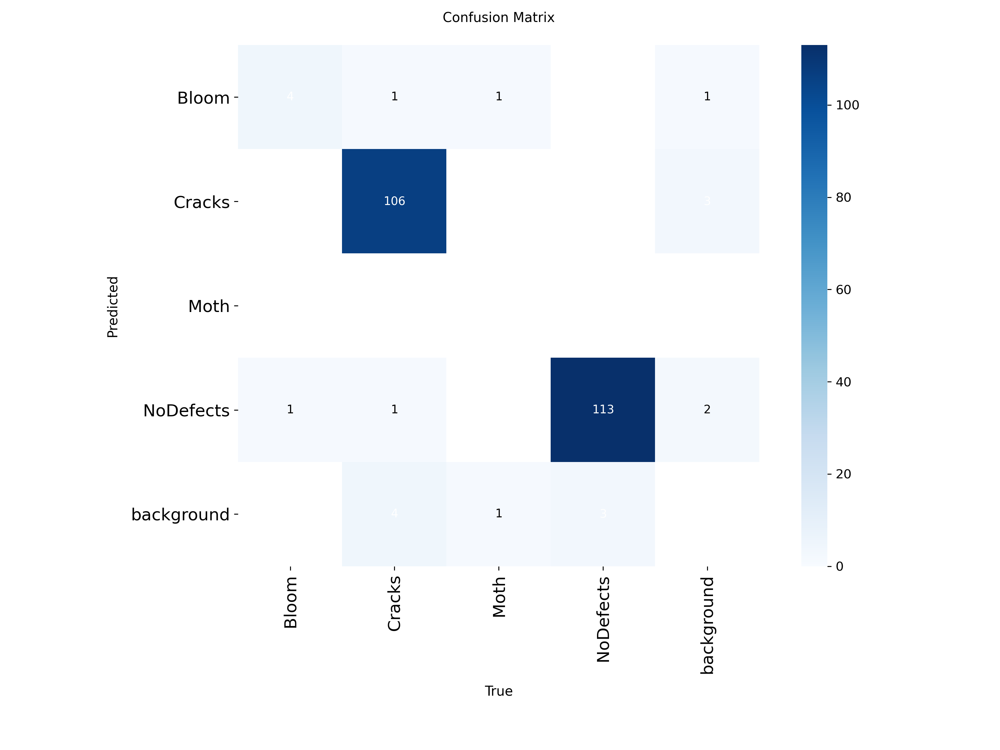

In [ ]:
# Вывод матрицы ошибок
from IPython.display import Image, display
display(Image('/content/runs/detect/train/confusion_matrix.png'))

**2. Кривые оптимизации обучения и кривые обучения производительности**

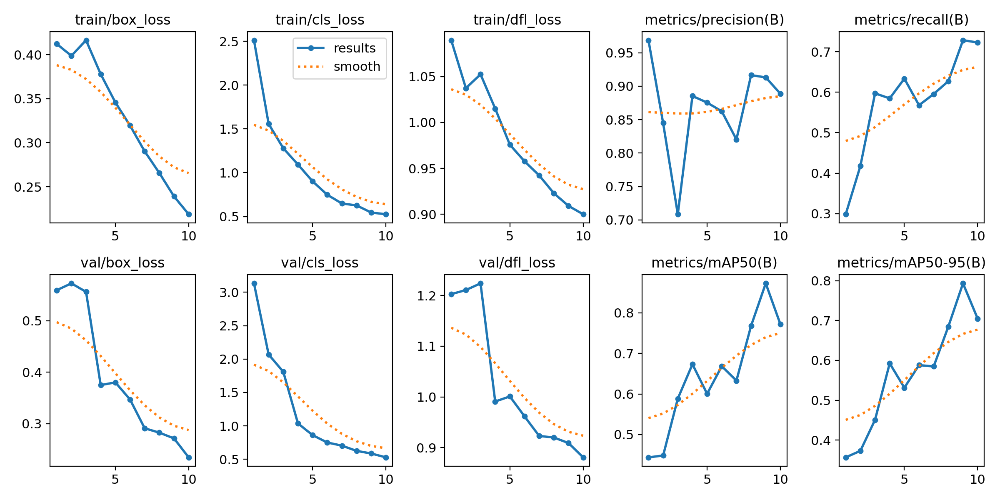

In [ ]:
# Результаты работы модели (графики)
display(Image('/content/runs/detect/train/results.png'))

**3. Результаты валидации**

In [ ]:
# Сравнение результатов валидации: истинных и предсказанных значений

# Установка необходимых библиотек
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Определение пути
train_path = '/content/runs/detect/train'

# Считываем изображения
# Рассматриваем батчи (batch) - подмножества обучающей выборки фиксированного размера
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')
img5 = mpimg.imread(f'{train_path}/val_batch2_labels.jpg')
img6 = mpimg.imread(f'{train_path}/val_batch2_pred.jpg')

# Получаем размеры изображения
img_height, img_width, _ = img1.shape

# Создаем несколько графиков в рамках одной фигуры, настраивая её размеры в соответствии с рахмерами изображений
fig, axes = plt.subplots(6, 1, figsize=(img_width / 100, 6 * img_height / 100))  # 6 rows, 1 column

# Переносим изображения на графики и определяем заголовки
axes[0].imshow(img1)
axes[0].set_title("Истинные значения - Батч 0", fontsize=22)  # Larger subplot title
axes[1].imshow(img2)
axes[1].set_title("Предсказанные значения - Батч 0", fontsize=22)

axes[2].imshow(img3)
axes[2].set_title("Истинные значения - Батч 1", fontsize=22)
axes[3].imshow(img4)
axes[3].set_title("Предсказанные значения - Батч 1", fontsize=22)

axes[4].imshow(img5)
axes[4].set_title("Истинные значения - Батч 2", fontsize=22)
axes[5].imshow(img6)
axes[5].set_title("Предсказанные значения - Батч 2", fontsize=22)

# Отключаем оси на всех графиках
for ax in axes:
    ax.axis('off')

# Регулируем отображение для предотвращения перекрытия
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Отображение результатов
plt.show()

# **Шаг 6.** Работа модели на тестовых данных

**1. Получение предсказаний**

In [ ]:
# Предсказания на тестовых данных

# Загрузка обученный модели
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Определение пути директории test
test_path = '/content/Chocolate-Defects-Detection-And-Classification-4/test/images'

# Получение всех изображений из директории test
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Осуществление предсказаний на каждом изображении
for img_path in image_files:
    results = model.predict(source=img_path, save=True, conf=0.50)


image 1/1 /content/Chocolate-Defects-Detection-And-Classification-4/test/images/5_jpg.rf.68d717a5e9f82ebefe5bbf04c31f8d00.jpg: 640x640 1 NoDefects, 229.3ms
Speed: 4.6ms preprocess, 229.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /content/Chocolate-Defects-Detection-And-Classification-4/test/images/photo_3_2025-04-15_18-08-11_jpg.rf.60717e4b61617b011682ce2b69046862.jpg: 640x640 1 Cracks, 217.8ms
Speed: 3.2ms preprocess, 217.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /content/Chocolate-Defects-Detection-And-Classification-4/test/images/photo_2025-04-15_16-48-26_jpg.rf.7cb3fb949e406bfe234e87a938467261.jpg: 640x640 1 NoDefects, 231.2ms
Speed: 3.1ms preprocess, 231.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /content/Chocolate-Defects-Detection-And-Classification-4/test/

**2. Отображение предсказаний**

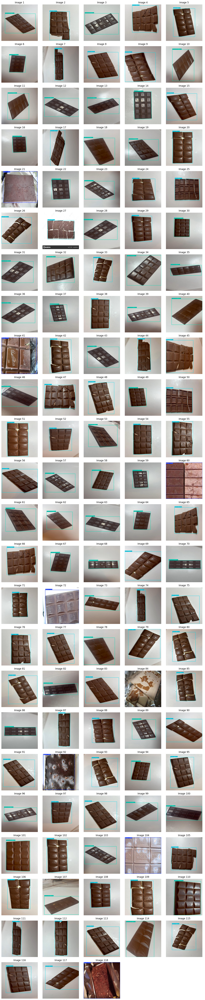

In [ ]:
# Определение пути к директории predict
pred_path = '/content/runs/detect/predict'

# Получение всех изображений из директории predict
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Определение числа изображений в ряду
images_per_row = 5

# Определение количества столбцов в соответствии с количеством строк
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Определение размера фигуры
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Выравнивание осей
axs = axs.flatten()

# Прохождение по каждому изображению и отображение предсказания
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Считывание изображения
    axs[i].imshow(img)                # Отображение изображения
    axs[i].axis('off')                # Отключние осей
    axs[i].set_title(f"Image {i+1}")  # Добавление заголовка

# Сокрытие всех лишних пустых подзаголовков (если количество изображений не кратно images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Отключение лишних осей

# Отображение всех изображений
plt.tight_layout()
plt.show()
